In [50]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [51]:
import tensorflow as tf
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.optimizers import RMSprop


In [52]:
def load_nifti_image(file_path):
    """Load and normalize a NIfTI file."""
    img = nib.load(file_path).get_fdata()
    img = (img - np.min(img)) / (np.max(img) - np.min(img))  # Normalize
    return img

In [53]:
def resize_image(img, target_shape=(128, 128)):
    """Resize image and add channel dimension."""
    img_resized = tf.image.resize(img, target_shape).numpy()
    return np.expand_dims(img_resized, axis=-1)  # Add channel dimension

In [54]:
import nibabel as nib
import numpy as np
import tensorflow as tf

def load_and_preprocess_nifti(file_path, target_shape=(128, 128)):
    """Load, slice, resize, and preprocess a NIfTI file."""
    # Load the NIfTI image and get the data
    img = nib.load(file_path).get_fdata()

    # Select the middle slice along the depth axis
    middle_slice = img[:, :, img.shape[2] // 2]  # Shape: (256, 256)

    # Add a channel dimension to make it (256, 256, 1)
    middle_slice = np.expand_dims(middle_slice, axis=-1)

    # Resize the image to (128, 128, 1)
    resized_img = tf.image.resize(middle_slice, target_shape).numpy()

    # Ensure the shape is (128, 128, 1) by squeezing extra dimensions
    resized_img = np.squeeze(resized_img)

    # Add the channel dimension back if needed (128, 128, 1)
    resized_img = np.expand_dims(resized_img, axis=-1)

    return resized_img

# Test the function
nifti_path = '/content/drive/MyDrive/ADNI/CN/ADNI_100_S_0015_MR_MPR-R____N3__Scaled_Br_20061213152852376_S8833_I33046.nii'
img_resized = load_and_preprocess_nifti(nifti_path)

print(f"Resized image shape: {img_resized.shape}")

Resized image shape: (128, 128, 1)


In [55]:
data_dir = '/content/drive/MyDrive/ADNI/'
categories = ['CN', 'MCI', 'AD']

In [56]:
X, y = [], []

for category in categories:
    category_path = os.path.join(data_dir, category)
    label = categories.index(category)  # Assign labels: CN=0, MCI=1, AD=2

    for file_name in os.listdir(category_path):
        if file_name.endswith('.nii') or file_name.endswith('.nii.gz'):
            file_path = os.path.join(category_path, file_name)
            img_resized = load_and_preprocess_nifti(file_path)

            X.append(img_resized)
            y.append(label)

In [57]:
X = np.array(X)
y = np.array(y)


In [58]:
print(f"Loaded {len(X)} images with shape: {X.shape}")
print(f"Labels shape: {y.shape}")

Loaded 12 images with shape: (12, 128, 128, 1)
Labels shape: (12,)


In [59]:
# Train-Test Split
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [60]:
from tensorflow.keras.utils import to_categorical

# Convert labels to one-hot encoding
y_train = to_categorical(y_train, num_classes=3)
y_test = to_categorical(y_test, num_classes=3)

print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")


y_train shape: (7, 3)
y_test shape: (3, 3)


In [61]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.optimizers import RMSprop

# Define the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),

    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(),

    Conv2D(128, (3, 3), activation='relu'),
    GlobalAveragePooling2D(),

    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(3, activation='softmax')  # 3 classes: CN, MCI, AD
])

# Compile the model
model.compile(optimizer=RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_194 (Conv2D)                  │ (None, 126, 126, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_203              │ (None, 63, 63, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_195 (Conv2D)                  │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_204              │ (None, 30, 30, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_196 (Conv2D)                  │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 3)                   │             195 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 101,507 (396.51 KB)

 Trainable params: 101,315 (395.76 KB)

 Non-trainable params: 192 (768.00 B)

In [62]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data augmentation to prevent overfitting
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

# Train the model
history = model.fit(datagen.flow(X_train, y_train, batch_size=32),
                    epochs=30,
                    validation_data=(X_test, y_test))


Epoch 1/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4286 - loss: 1.1167

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.4286 - loss: 1.1167 - val_accuracy: 0.3333 - val_loss: 2.7219
Epoch 2/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step - accuracy: 0.1429 - loss: 1.2641 - val_accuracy: 0.3333 - val_loss: 2.9286
Epoch 3/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step - accuracy: 0.4286 - loss: 1.0550 - val_accuracy: 0.3333 - val_loss: 2.6116
Epoch 4/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step - accuracy: 0.4286 - loss: 1.0389 - val_accuracy: 0.3333 - val_loss: 2.4408
Epoch 5/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step - accuracy: 0.4286 - loss: 0.9235 - val_accuracy: 0.3333 - val_loss: 2.6818
Epoch 6/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step - accuracy: 0.4286 - loss: 1.0268 - val_accuracy: 0.3333 - val_loss: 2.6110
Epoch 7/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.2857 - loss: 1.1528 - val_accuracy: 0.3333 - val_loss: 2.6107
Epoch 8/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step - accuracy: 0.4286 - loss: 1.0212 - val_accuracy: 0.3333 - val_loss: 2.4828
Epoch 

In [63]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=2)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")


1/1 - 0s - 46ms/step - accuracy: 0.3333 - loss: 2.6007
Test Accuracy: 33.33%


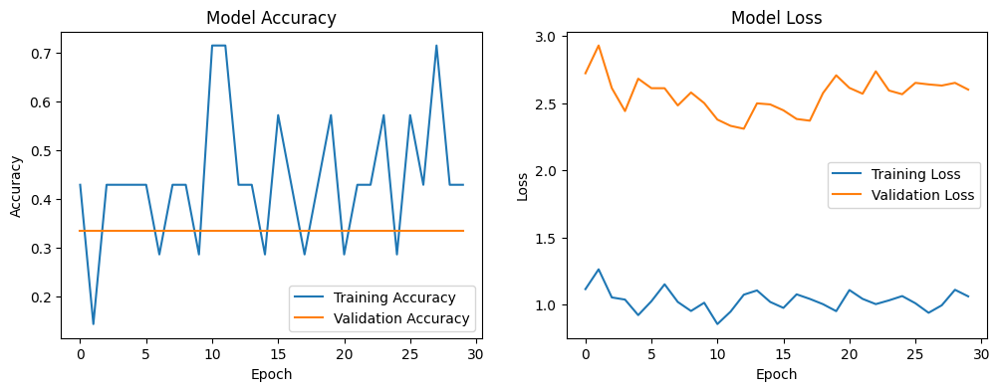

In [64]:
import matplotlib.pyplot as plt

def plot_history(history):
    plt.figure(figsize=(12, 4))

    # Plot training & validation accuracy values
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot training & validation loss values
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_history(history)



In [65]:
from sklearn.model_selection import StratifiedShuffleSplit

# Ensure labels are in integer form
y_flat = y  # Use y directly if it is 1D and contains integers

# Stratified splitting to maintain class proportions
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in sss.split(X, y_flat):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

print(f"Train set classes: {np.unique(y_train)}")
print(f"Test set classes: {np.unique(y_test)}")


Train set classes: [0 1 2]
Test set classes: [0 1 2]


In [66]:
# Check class distribution
unique_train, counts_train = np.unique(y_train, return_counts=True)
unique_test, counts_test = np.unique(y_test, return_counts=True)

print(f"Training set class distribution: {dict(zip(unique_train, counts_train))}")
print(f"Test set class distribution: {dict(zip(unique_test, counts_test))}")


Training set class distribution: {0: 3, 1: 3, 2: 3}
Test set class distribution: {0: 1, 1: 1, 2: 1}


In [67]:
!pip install opencv-python-headless matplotlib nibabel scikit-image



In [68]:
import cv2
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from skimage import exposure
from tensorflow.keras.preprocessing.image import ImageDataGenerator


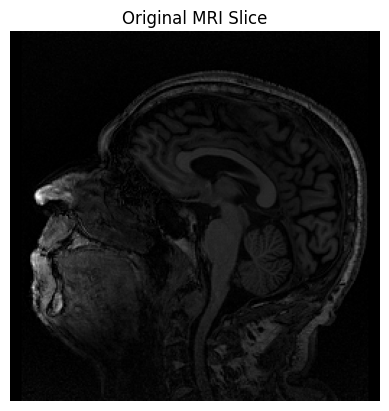

In [69]:
# Load NIfTI file
nifti_path = '/content/drive/MyDrive/ADNI/CN/ADNI_100_S_0015_MR_MPR-R____N3__Scaled_Br_20061213152852376_S8833_I33046.nii'
img = nib.load(nifti_path).get_fdata()

# Select the middle slice for visualization
middle_slice = img[:, :, img.shape[2] // 2]

# Display the raw middle slice
plt.imshow(middle_slice, cmap='gray')
plt.title("Original MRI Slice")
plt.axis('off')
plt.show()


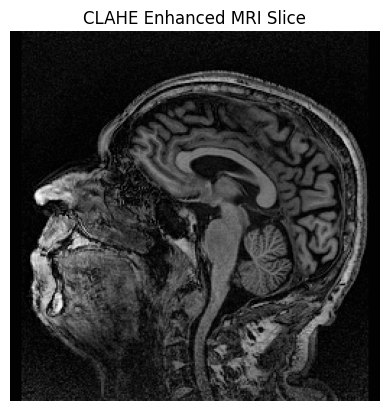

In [70]:
def apply_clahe(image, clip_limit=3.0, tile_grid_size=(12, 12)):
    """Apply CLAHE to enhance the contrast of the MRI slice."""
    # Convert the image to uint8 type (required for CLAHE)
    img_uint8 = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    # Create a CLAHE object
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

    # Apply CLAHE
    enhanced_img = clahe.apply(img_uint8)

    return enhanced_img

# Apply CLAHE to the middle slice
clahe_image = apply_clahe(middle_slice)

# Display the enhanced slice
plt.imshow(clahe_image, cmap='gray')
plt.title("CLAHE Enhanced MRI Slice")
plt.axis('off')
plt.show()


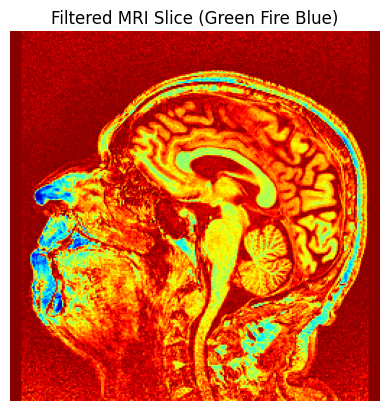

In [71]:
def apply_color_filter(image, colormap=cv2.COLORMAP_JET):
    """Apply a color map filter to the image."""
    # Normalize the image for colormap application
    normalized_img = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    # Apply the colormap
    color_mapped_img = cv2.applyColorMap(normalized_img, colormap)

    return color_mapped_img

# Apply Green Fire Blue filter (can use other colormaps too)
filtered_image = apply_color_filter(clahe_image)

# Display the filtered image
plt.imshow(filtered_image)
plt.title("Filtered MRI Slice (Green Fire Blue)")
plt.axis('off')
plt.show()


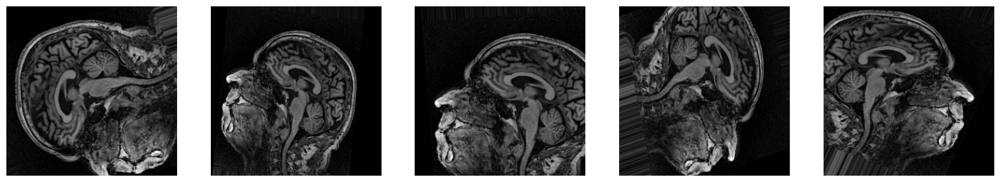

In [72]:
# Define the data augmentation generator
datagen = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=90,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2
)

# Prepare a batch of one image for demonstration
sample = np.expand_dims(np.expand_dims(clahe_image, axis=-1), axis=0)  # Shape (1, 128, 128, 1)

# Generate augmented samples
aug_iter = datagen.flow(sample, batch_size=1)

# Plot augmented images
fig, ax = plt.subplots(1, 5, figsize=(20, 5))
for i in range(5):
    aug_image = next(aug_iter)[0].astype('uint8').squeeze()
    ax[i].imshow(aug_image, cmap='gray')
    ax[i].axis('off')
plt.show()


In [73]:

import nibabel as nib

# Load the NIfTI file
nifti_path = '/content/drive/MyDrive/ADNI/CN/ADNI_100_S_0015_MR_MPR-R____N3__Scaled_Br_20061213152852376_S8833_I33046.nii'  # Replace with your actual file path
img = nib.load(nifti_path).get_fdata()

# Print the shape to understand the dimensions
print(f"Image shape: {img.shape}")


Image shape: (256, 256, 170)


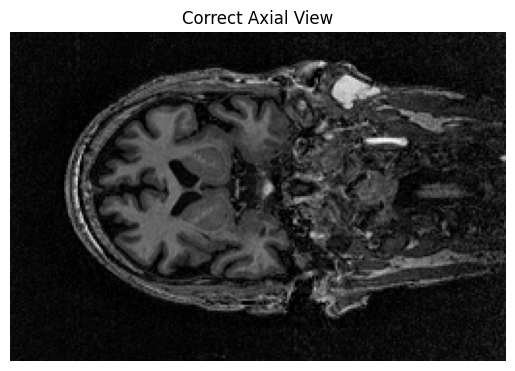

In [74]:
import matplotlib.pyplot as plt

# Extract an axial view (assuming it's along the Y-axis in your data)
axial_slice = img[:, img.shape[1] // 2, :]

# Display the axial slice
plt.imshow(axial_slice.T, cmap='gray', origin='lower')
plt.title("Correct Axial View")
plt.axis('off')
plt.show()



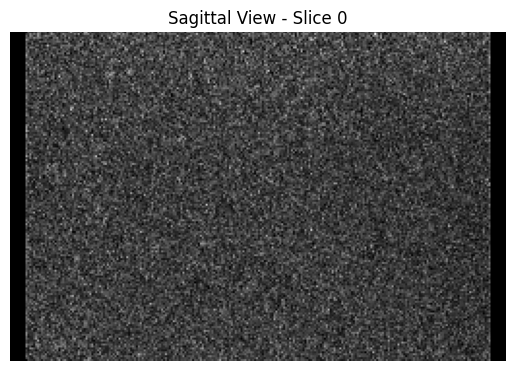

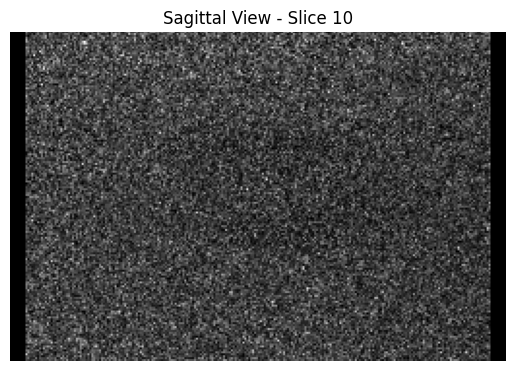

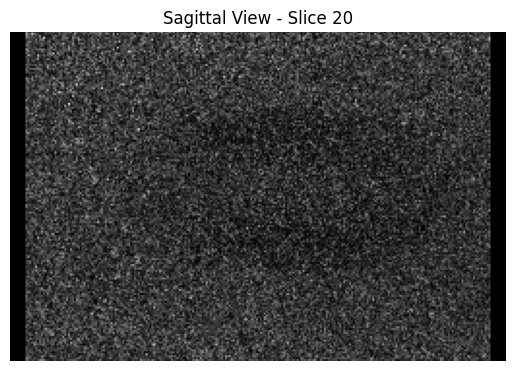

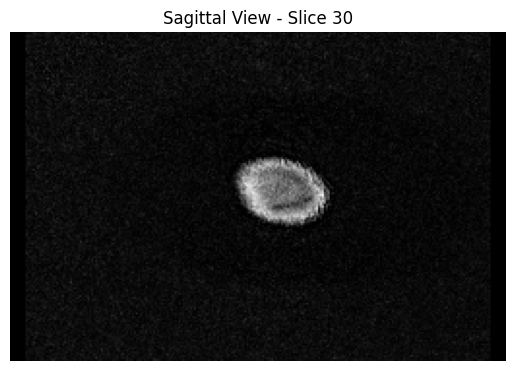

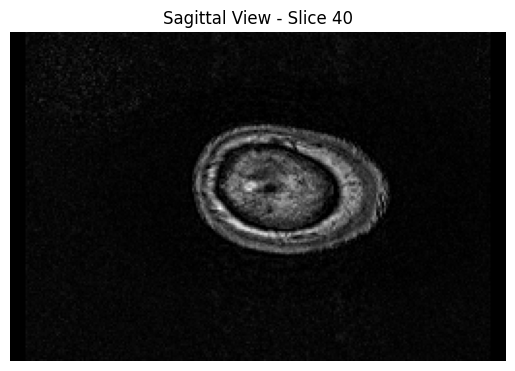

...

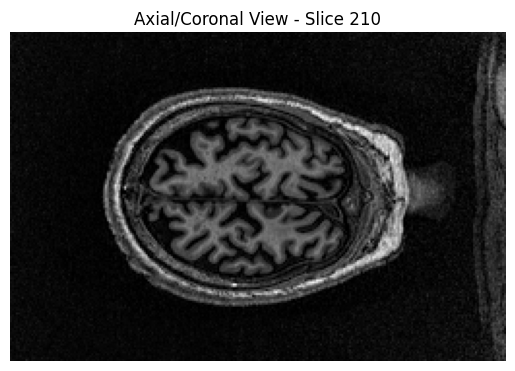

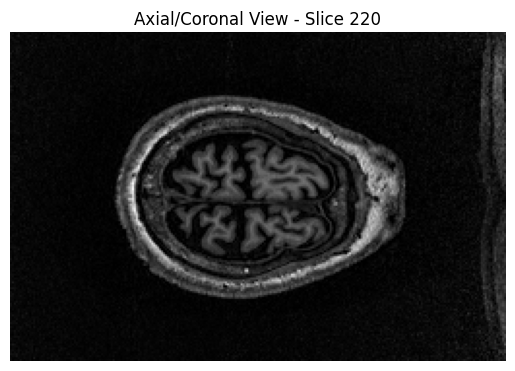

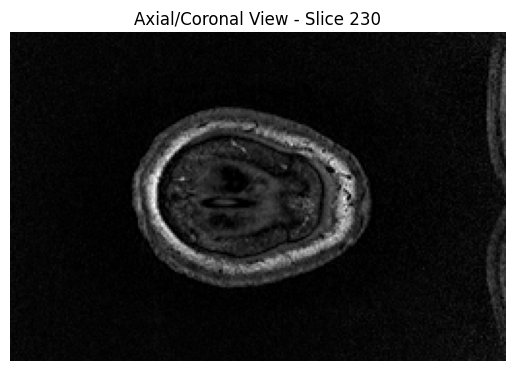

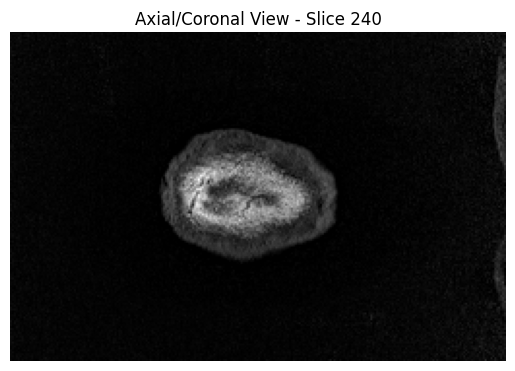

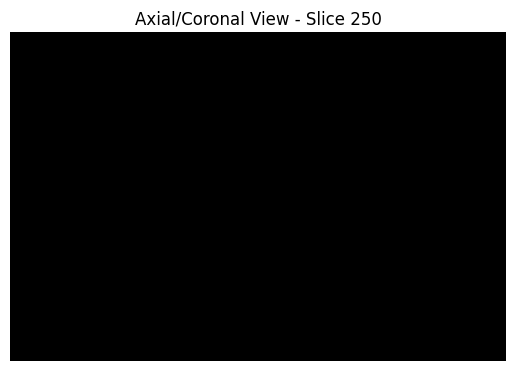

In [75]:
# Iterate through the X-axis (sagittal view check)
for i in range(0, img.shape[0], 10):
    plt.imshow(img[i, :, :].T, cmap='gray', origin='lower')
    plt.title(f"Sagittal View - Slice {i}")
    plt.axis('off')
    plt.show()

# Iterate through the Y-axis (axial or coronal view check)
for i in range(0, img.shape[1], 10):
    plt.imshow(img[:, i, :].T, cmap='gray', origin='lower')
    plt.title(f"Axial/Coronal View - Slice {i}")
    plt.axis('off')
    plt.show()


In [76]:
# Get the header information from the NIfTI file
header = nib.load(nifti_path).header
print(header)


<class 'nibabel.nifti1.Nifti1Header'> object, endian='>'
sizeof_hdr      : 348
data_type       : b''
db_name         : b'100_S_0015'
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3 256 256 170   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [1.       1.01295  1.000057 1.202091 1.       1.       1.       1.      ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 2
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 3077
glmin           : 0
descrip         : b'MPR-R; ; N3; Scaled'
aux_file        : b'none'
qform_code      : scanner
sform_code      : unknown
quatern_b       : 0.70710677
quatern_c       : -7.4582305e-09
quatern_d       : -0.70710677
qoffset_x 

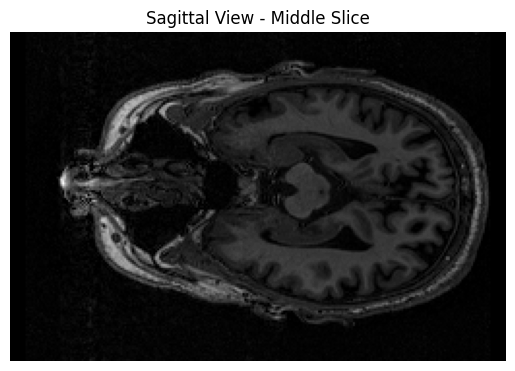

In [77]:
# Sagittal view slice (left to right)
sagittal_slice = img[img.shape[0] // 2, :, :]

plt.imshow(sagittal_slice.T, cmap='gray', origin='lower')
plt.title("Sagittal View - Middle Slice")
plt.axis('off')
plt.show()


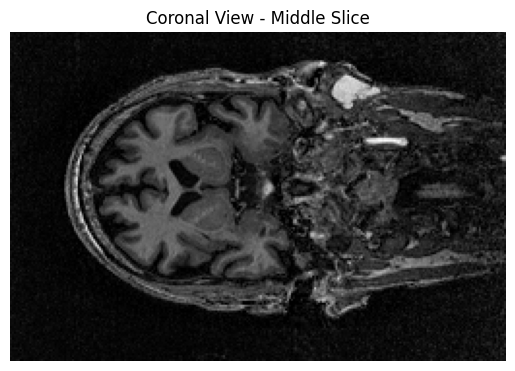

In [78]:
# Coronal view slice (front to back)
coronal_slice = img[:, img.shape[1] // 2, :]

plt.imshow(coronal_slice.T, cmap='gray', origin='lower')
plt.title("Coronal View - Middle Slice")
plt.axis('off')
plt.show()


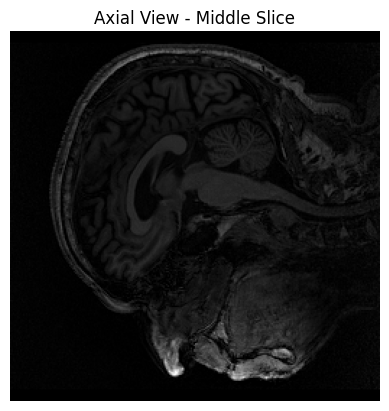

In [79]:
# Axial view slice (top to bottom)
axial_slice = img[:, :, img.shape[2] // 2]

plt.imshow(axial_slice.T, cmap='gray', origin='lower')
plt.title("Axial View - Middle Slice")
plt.axis('off')
plt.show()


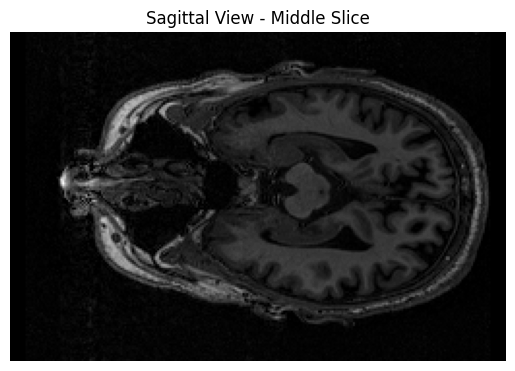

In [80]:
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NIfTI file
nifti_path = '/content/drive/MyDrive/ADNI/CN/ADNI_100_S_0015_MR_MPR-R____N3__Scaled_Br_20061213152852376_S8833_I33046.nii'  # Replace with your file path
img = nib.load(nifti_path).get_fdata()

# Extract the middle sagittal slice (along the X-axis)
sagittal_slice = img[img.shape[0] // 2, :, :]

# Display the sagittal slice
plt.imshow(sagittal_slice.T, cmap='gray', origin='lower')
plt.title("Sagittal View - Middle Slice")
plt.axis('off')
plt.show()


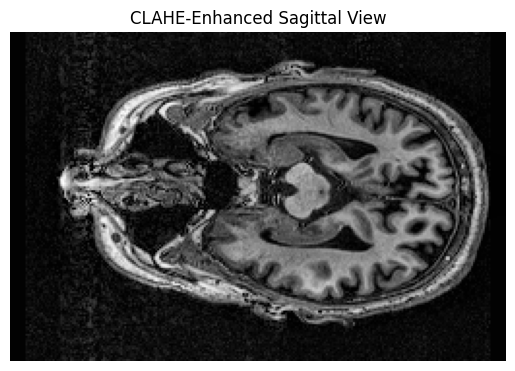

In [81]:
clahe_sagittal = apply_clahe(sagittal_slice)
plt.imshow(clahe_sagittal.T, cmap='gray', origin='lower')
plt.title("CLAHE-Enhanced Sagittal View")
plt.axis('off')
plt.show()

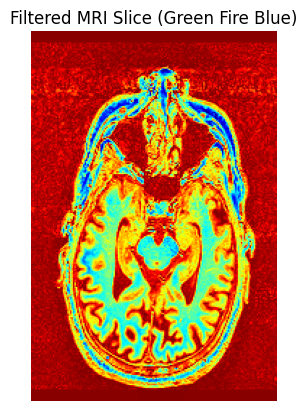

In [82]:
sagittal_green = apply_color_filter(clahe_sagittal)

# Display the filtered image
plt.imshow(sagittal_green)
plt.title("Filtered MRI Slice (Green Fire Blue)")
plt.axis('off')
plt.show()

In [83]:
import os

def preprocess_nifti_slices(nifti_path):
    """Load and preprocess all slices from a NIfTI file."""
    # Load NIfTI data
    img = nib.load(nifti_path).get_fdata()

    preprocessed_slices = []

    # Process each slice along the depth axis
    for i in range(img.shape[2]):
        slice_img = img[:, :, i]

        # Apply CLAHE enhancement
        enhanced_slice = apply_clahe(slice_img)

        # Apply color filter (optional)
        filtered_slice = apply_color_filter(enhanced_slice)

        preprocessed_slices.append(filtered_slice)

    return np.array(preprocessed_slices)

# Example usage
nifti_path = '/content/drive/MyDrive/ADNI/CN/ADNI_100_S_0015_MR_MPR-R____N3__Scaled_Br_20061213152852376_S8833_I33046.nii'
preprocessed_data = preprocess_nifti_slices(nifti_path)
print(f"Preprocessed data shape: {preprocessed_data.shape}")


Preprocessed data shape: (170, 256, 256, 3)


In [84]:
# Save the preprocessed slices as a .npy file
np.save('preprocessed_mri_slices.npy', preprocessed_data)

# Load preprocessed data (for future use)
loaded_data = np.load('preprocessed_mri_slices.npy')
print(f"Loaded data shape: {loaded_data.shape}")


Loaded data shape: (170, 256, 256, 3)


In [85]:
from sklearn.model_selection import train_test_split

# Split into train, validation, and test sets
X_train, X_temp = train_test_split(loaded_data, test_size=0.4, random_state=42)
X_val, X_test = train_test_split(X_temp, test_size=0.5, random_state=42)

print(f"Training set shape: {X_train.shape}")
print(f"Validation set shape: {X_val.shape}")
print(f"Test set shape: {X_test.shape}")


Training set shape: (102, 256, 256, 3)
Validation set shape: (34, 256, 256, 3)
Test set shape: (34, 256, 256, 3)


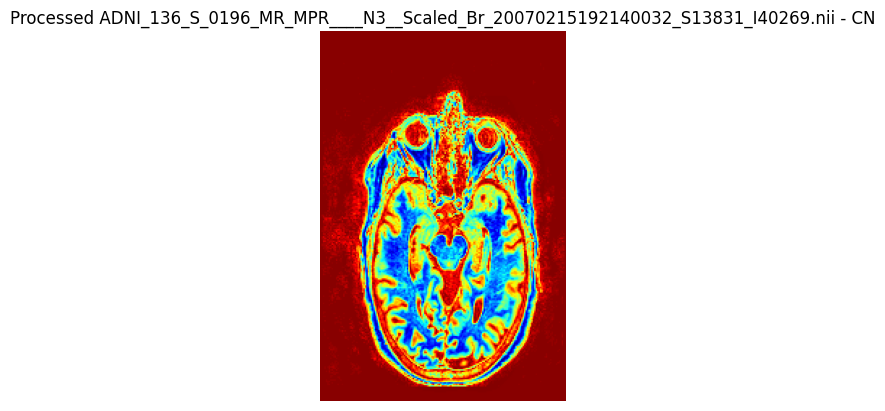

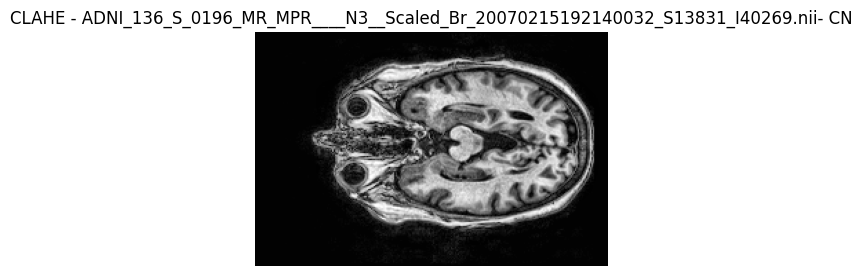

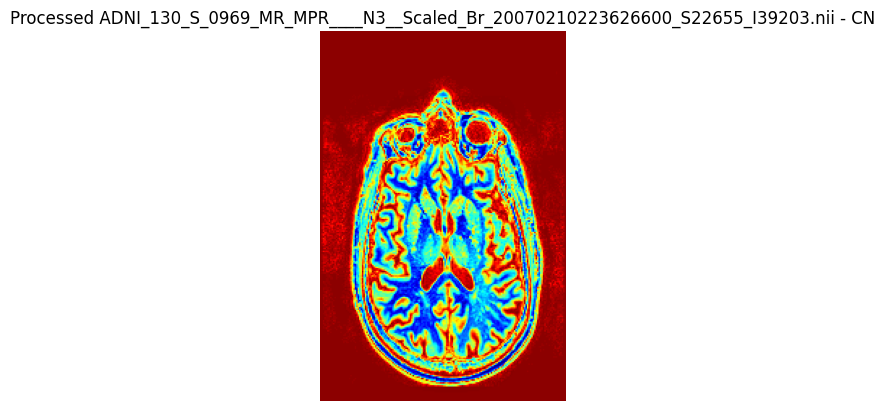

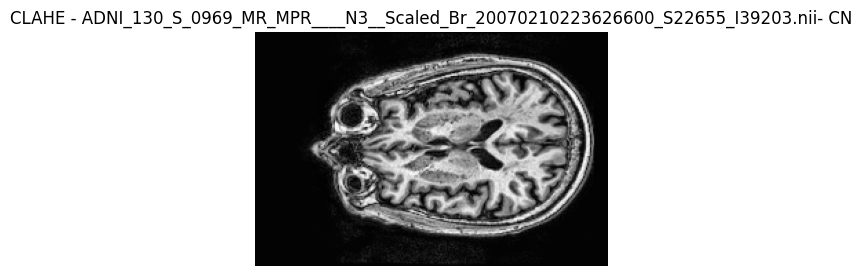

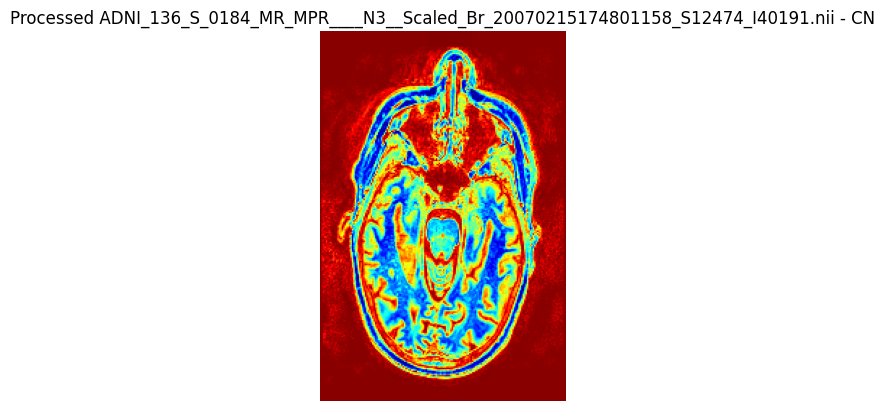

...

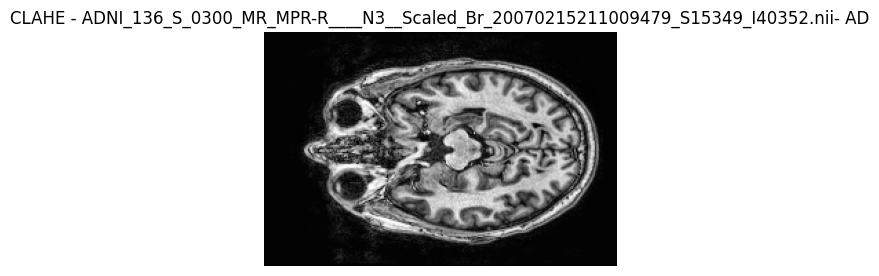

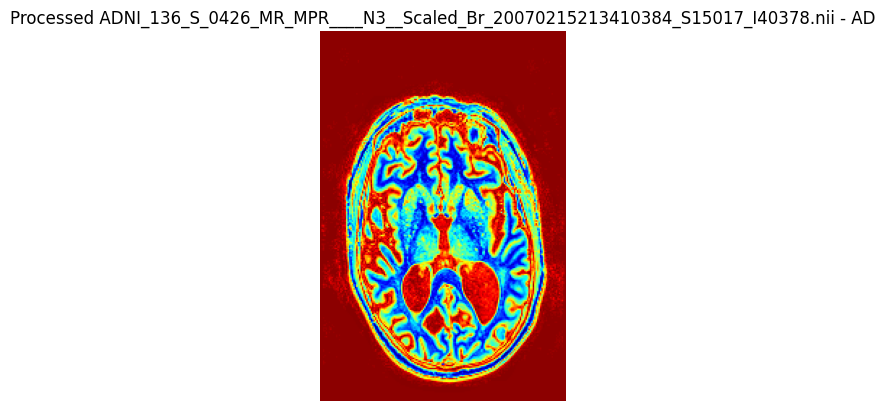

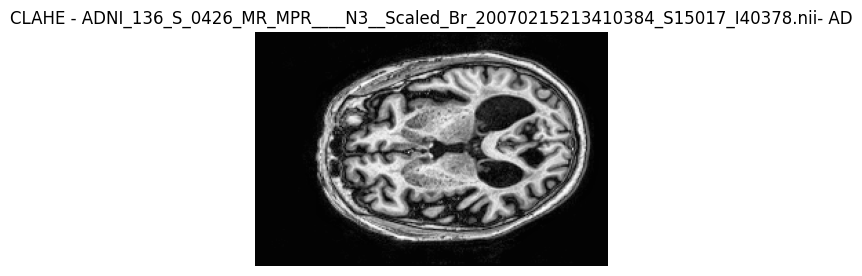

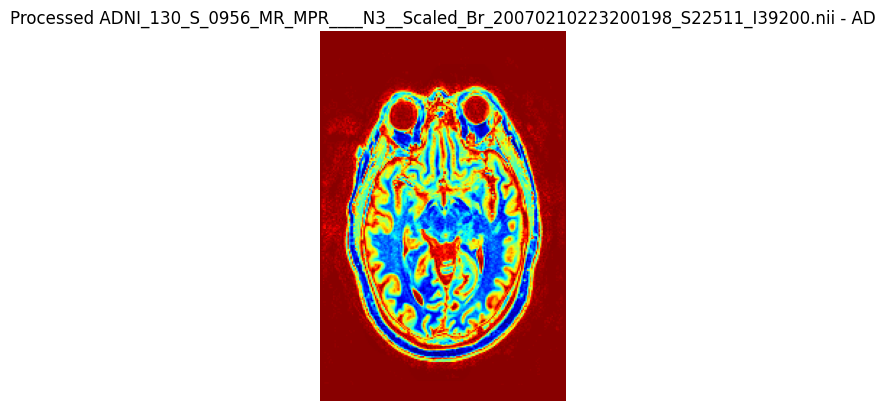

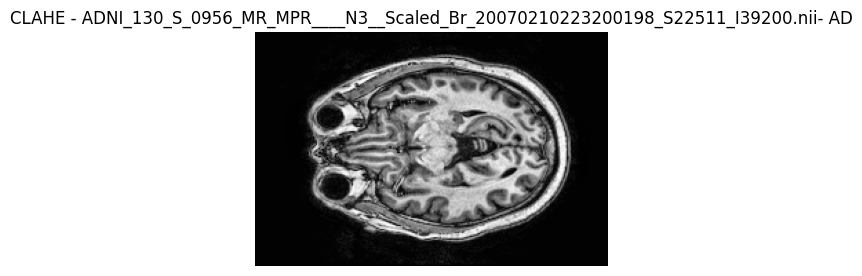

In [86]:
import os
import nibabel as nib
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Define the input and output directories
input_dir = '/content/drive/MyDrive/ADNI/'  # Replace with the path to your dataset folder
output_dir = 'processed_mri_images'  # Directory to save processed images
os.makedirs(output_dir, exist_ok=True)

# Define categories (e.g., CN, MCI, AD)
categories = ['CN', 'MCI', 'AD']  # Add other categories if needed

def apply_clahe(image, clip_limit=3.0, tile_grid_size=(12, 12)):
    """Apply CLAHE to enhance the contrast."""
    img_uint8 = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    enhanced_img = clahe.apply(img_uint8)
    return enhanced_img

def apply_color_filter(image, colormap=cv2.COLORMAP_JET):
    """Apply a color map filter to the image."""
    # Normalize the image for colormap application
    normalized_img = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    # Apply the colormap
    color_mapped_img = cv2.applyColorMap(normalized_img, colormap)

    return color_mapped_img

# Iterate through all categories and process MRI images
for category in categories:
    category_path = os.path.join(input_dir, category)
    output_category_path = os.path.join(output_dir, category)
    os.makedirs(output_category_path, exist_ok=True)

    # Process each NIfTI file in the category
    for filename in os.listdir(category_path):
        if filename.endswith('.nii') or filename.endswith('.nii.gz'):
            # Load the NIfTI file
            nifti_path = os.path.join(category_path, filename)
            img = nib.load(nifti_path).get_fdata()

            # Process the middle sagittal slice for each MRI image
            sagittal_slice = img[img.shape[0] // 2, :, :]

            # Apply CLAHE
            clahe_slice = apply_clahe(sagittal_slice)

            # Apply Green-Blue filter
            filtered_slice = apply_color_filter(clahe_slice)

            # Save the processed image
            output_image_path = os.path.join(output_category_path, f'{filename[:-4]}_processed.png')
            cv2.imwrite(output_image_path, filtered_slice)

            # Optional: Display the processed image
            plt.imshow(filtered_slice)
            plt.title(f"Processed {filename} - {category}")
            plt.axis('off')
            plt.show()

            # Display CLAHE image
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(clahe_slice.T, cmap='gray', origin='lower')
            plt.title(f"CLAHE - {filename}- {category}")
            plt.axis('off')
            plt.show()

In [87]:
# Split the data into 80% training and 20% test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training set shape: {X_train.shape}, Labels shape: {y_train.shape}")
print(f"Test set shape: {X_test.shape}, Labels shape: {y_test.shape}")


Training set shape: (9, 128, 128, 1), Labels shape: (9,)
Test set shape: (3, 128, 128, 1), Labels shape: (3,)


In [88]:
# Modify the CNN model to accept grayscale images
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),  # Change input_shape
    MaxPooling2D((2, 2)),
    BatchNormalization(),

    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(),

    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(),

    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(3, activation='softmax')  # 3 output classes: CN, MCI, AD
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()



/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_197 (Conv2D)                  │ (None, 126, 126, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_15 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_205              │ (None, 63, 63, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_198 (Conv2D)                  │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_16 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_206              │ (None, 30, 30, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_199 (Conv2D)                  │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_17 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_207              │ (None, 14, 14, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 64)                  │       1,605,696 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 3)                   │             195 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,699,459 (6.48 MB)

 Trainable params: 1,699,011 (6.48 MB)

 Non-trainable params: 448 (1.75 KB)

In [89]:
# Check the distribution of classes in the train and test sets
unique_train, counts_train = np.unique(y_train, return_counts=True)
print(f"Training set class distribution: {dict(zip(unique_train, counts_train))}")

unique_test, counts_test = np.unique(y_test, return_counts=True)
print(f"Test set class distribution: {dict(zip(unique_test, counts_test))}")


Training set class distribution: {0: 3, 1: 4, 2: 2}
Test set class distribution: {0: 1, 2: 2}


In [90]:
from sklearn.model_selection import StratifiedShuffleSplit

# Perform stratified splitting to maintain class proportions
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

# Check the distribution again
unique_train, counts_train = np.unique(y_train, return_counts=True)
unique_test, counts_test = np.unique(y_test, return_counts=True)

print(f"Training set class distribution: {dict(zip(unique_train, counts_train))}")
print(f"Test set class distribution: {dict(zip(unique_test, counts_test))}")


Training set class distribution: {0: 3, 1: 3, 2: 3}
Test set class distribution: {0: 1, 1: 1, 2: 1}


In [91]:
from sklearn.utils.class_weight import compute_class_weight

# Compute class weights to handle class imbalance
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = dict(enumerate(class_weights))

print(f"Class weights: {class_weights}")

# Train the model with class weights
history = model.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    class_weight=class_weights,
    verbose=2
)


Class weights: {0: 1.0, 1: 1.0, 2: 1.0}
Epoch 1/20
1/1 - 4s - 4s/step - accuracy: 0.6667 - loss: 0.9822
Epoch 2/20
1/1 - 0s - 331ms/step - accuracy: 0.5556 - loss: 1.6445
Epoch 3/20
1/1 - 1s - 591ms/step - accuracy: 0.8889 - loss: 1.1473
Epoch 4/20
1/1 - 0s - 290ms/step - accuracy: 0.5556 - loss: 5.6217
Epoch 5/20
1/1 - 0s - 324ms/step - accuracy: 0.7778 - loss: 0.5914
Epoch 6/20
1/1 - 0s - 299ms/step - accuracy: 1.0000 - loss: 0.0183
Epoch 7/20
1/1 - 1s - 612ms/step - accuracy: 0.8889 - loss: 0.9856
Epoch 8/20
1/1 - 0s - 296ms/step - accuracy: 0.8889 - loss: 0.2177
Epoch 9/20
1/1 - 0s - 310ms/step - accuracy: 0.7778 - loss: 1.1631
Epoch 10/20
1/1 - 0s - 275ms/step - accuracy: 0.8889 - loss: 0.1348
Epoch 11/20
1/1 - 0s - 307ms/step - accuracy: 1.0000 - loss: 0.0016
Epoch 12/20
1/1 - 0s - 292ms/step - accuracy: 0.7778 - loss: 0.8556
Epoch 13/20
1/1 - 0s - 296ms/step - accuracy: 1.0000 - loss: 0.0573
Epoch 14/20
1/1 - 0s - 299ms/step - accuracy: 0.8889 - loss: 0.2720
Epoch 15/20
1/1 - 0s

In [92]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, GlobalAveragePooling2D, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import InceptionV3

# Constants
IMAGE_SIZE = 255
NUM_CLASSES = 3  # For AD, CN, MCI

# Load the InceptionV3 base model
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# Freeze the base model layers to retain pre-trained weights
base_model.trainable = False

# Build the AlzheimerNet model
x = base_model.output

# Step 1: Add Batch Normalization and Dropout
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

# Step 2: Global Average Pooling
x = GlobalAveragePooling2D()(x)

# Step 3: Flattening layer
x = Flatten()(x)

# Step 4: Dense layer with 512 neurons and ReLU activation
x = Dense(512, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

# Step 5: Dense layer with 256 neurons and ReLU activation
x = Dense(256, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

# Step 6: Dense layer with 128 neurons and ReLU activation
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

# Step 7: Dense layer with 64 neurons and ReLU activation
x = Dense(64, activation='relu')(x)
x = BatchNormalization()(x)

# Step 8: Output layer with Softmax activation for multi-class classification
output = Dense(NUM_CLASSES, activation='softmax')(x)

# Create the model
model = Model(inputs=base_model.input, outputs=output)

# Compile the model with RMSprop optimizer
model.compile(optimizer=RMSprop(learning_rate=0.00001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 255, 255, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_200 (Conv2D)       │ (None, 127, 127, 32)   │            864 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_208   │ (None, 127, 127, 32)   │             96 │ conv2d_200[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_188            │ (None, 127, 127, 32)   │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_201 (Conv2D)       │ (None, 125, 125, 32)   │          9,216 │ activation_188[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_209   │ (None, 125, 125, 32)   │             96 │ conv2d_201[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_189            │ (None, 125, 125, 32)   │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_202 (Conv2D)       │ (None, 125, 125, 64)   │         18,432 │ activation_189[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_210   │ (None, 125, 125, 64)   │            192 │ conv2d_202[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_190            │ (None, 125, 125, 64)   │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_18          │ (None, 62, 62, 64)     │              0 │ activation_190[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_203 (Conv2D)       │ (None, 62, 62, 80)     │          5,120 │ max_pooling2d_18[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_211   │ (None, 62, 62, 80)     │            240 │ conv2d_203[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_191            │ (None, 62, 62, 80)     │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_204 (Conv2D)  

 Total params: 23,036,579 (87.88 MB)

 Trainable params: 1,227,779 (4.68 MB)

 Non-trainable params: 21,808,800 (83.19 MB)